<a name="top"></a>
<div style="width:1000 px">

<div style="float:right; width:98 px; height:98px;">
<img src="https://cdn.miami.edu/_assets-common/images/system/um-logo-gray-bg.png" alt="Miami Logo" style="height: 98px;">
</div>

<div style="float:right; width:98 px; height:98px;">
<img src="https://media.licdn.com/dms/image/C4E0BAQFlOZSAJABP4w/company-logo_200_200/0/1548285168598?e=2147483647&v=beta&t=g4jl8rEhB7HLJuNZhU6OkJWHW4cul_y9Kj_aoD7p0_Y" alt="STI Logo" style="height: 98px;">
</div>


<h1>Plot Contour Maps for Database Files</h1>
By: Kayla Besong, PhD
    <br>
Last Edited: 05/17/24
<br>
<br>    
<br>
Four plotting examples using the sFWRD:
<br>
<br>
    1) Plot the average daily temperature, averaged over the study period for each of the six reanalysis/model products.  
    <br>
    2) Plot the average daily temperature, seasonally averaged over the study period for each of the six reanalysis/model products.
    <br>
    3) Plot average daily total Precip over Alaska, averaged over the study period where database files are available. 
    <br>
    4) Plot max wind over Hawai'i, averaged over the study period where database files are available
<div style="clear:both"></div>
</div>

<hr style="height:2px;">

## Import needed libraries, etc.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import pandas as pd
import os
import glob
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from mpl_toolkits.axes_grid1 import AxesGrid
from cartopy.mpl.geoaxes import GeoAxes
import matplotlib.ticker as mticker
from cartopy.util import add_cyclic_point
import cartopy.feature as cf


In [2]:
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')
pd.options.mode.chained_assignment = None

## The integral notebook of functions to run

In [4]:
%run ../../../../Universal_Functions/File_concat_mod_functions.ipynb

In [5]:
def formatter(ax, extent, lccproj, i = None, ncols = None, nrows = None, y_gridlines = None, x_gridlines = None, gridline_font = None, gridline_rotation = None):
    
    ''' This function is designed to format cartopy subplots. This eliminates redundancy. 

    Input Variables:

        ax: (cartopy.mpl.geoaxes.GeoAxesSubplot) The subplot object. 
        extent: (list of 4) Extent of the map in [west, east, south, north].
        lccproj: (cartopy.crs) Cartopy projection object 

        Optional if you want gridlines:
        
            i: (int) iterable to determine if grid labels should be plotted 
            ncols: (int) the number of columns in the plot
            nrows: (int) the number of rows in the plot
            y_gridlines: (numpy.ndarray) np.arange of latitude ticks you would like plotted. Ex: np.arange(0, 80, 20)
            x_gridlines: (numpy.ndarray) np.arange of longitude ticks you would like plotted. Ex: np.arange(-180,40, 20)
            gridline_font: (int) fontsize for tick labels 
            gridline_rotation: (int) fontsize for tick labels
            
    Output:
    
        The input ax (cartopy.mpl.geoaxes.GeoAxesSubplot) object but formatted accordingly. '''
    
    
    ax.set_extent(extent, crs = lccproj)                                                                                          # Set the geographic extent of the plot to the specified extent and coordinate reference system
    ax.add_feature(cf.STATES, linewidth=1.5, edgecolor='grey', alpha = 0.3)                                                       # Add state boundaries to the plot with specified style
    ax.coastlines(zorder = 10, linewidths = 1.5, color='grey', alpha = 0.5)                                                       # Add coastlines to the plot with specified style
    
    try:
        if len(y_gridlines) > 0 and len(x_gridlines) > 0:                                                                         # Check if gridlines for both axes are specified
            gl = ax.gridlines(color = 'lightgrey', draw_labels=True, linewidths = 1.5, x_inline=False, y_inline=False)            # Add gridlines with labels to the plot
            gl.ylocator = mticker.FixedLocator(y_gridlines)                                                                       # Set fixed locations for y-axis gridlines
            gl.xlocator = mticker.FixedLocator(x_gridlines)                                                                       # Set fixed locations for x-axis gridlines
            gl.xformatter = LONGITUDE_FORMATTER                                                                                   # Set formatter for x-axis labels to display longitude
            gl.yformatter = LATITUDE_FORMATTER                                                                                    # Set formatter for y-axis labels to display latitude
            gl.xlabel_style = {'size': gridline_font, 'rotation': gridline_rotation}                                              # Customize style for x-axis labels
            gl.ylabel_style = {'size': gridline_font, 'rotation': gridline_rotation}                                              # Customize style for y-axis labels
      
            # Adjust visibility of labels based on subplot position  
            if i % ncols == 0:                                                                                                    # If the subplot is in the first column
                gl.right_labels = False  
                gl.left_labels = True  
            
            elif (i % ncols) == (ncols - 1):                                                                                      # If the subplot is in the last column
                gl.right_labels = True  
                gl.left_labels = False  
            
            else:                                                                                                                 # For middle columns
                gl.right_labels = False  
                gl.left_labels = False 

            # print(i, nrows, ((i//nrows)+ncols), (i % nrows)+1 )
            #   (i//ncols)+1)
            if ((i//ncols)+1) == nrows:                                                                                             # If the subplot is in the last row
                gl.bottom_labels = True  
            
            elif nrows-1 == 0:                                                                                                    # If there is only one row
                gl.bottom_labels = True  
            
            else:                                                                                                                 # For upper rows
                gl.bottom_labels = False  
            
            gl.top_labels = False                                                                                                 # Disable top labels for all subplots
      
    except:  
        pass                                                                                                                      # Ignore exceptions and continue
      
    return ax                                                                                                                     # Return the modified axis object

# Database Options! 

After the database is finalized, these are the available variables and models available! Not all variables are available for all models! Plot away.

In [6]:
model_options = ['ERA5', 'NCEP', 'NARR', 'NAM', 'HRRR', 'CONUS404']

In [7]:
variable_options = ['pbl','cape','mlcape','scape','sm','vsm','u10','v10','gust','prate','tp','tcp','lspr','t2','rh','d2','ws','wd','hdw','vpd','ffwi']

In [8]:
time_options = ['Abs', 'AVG_Daily', 'MAX_Daily', 'MIN_Daily'] 

In [9]:
## various extents 

conus_extent = [-125, -67, 23, 52]
ak_extent = [-175, -135, 45, 75]
hi_extent = [-160, -154.5, 18, 23]

# Example for: CONUS AVG Daily Temperatures for All Models

In [20]:
### set the inputs for the type of plot you'd like based on the options above 

input_dir = '../../../../../database_files_final'
v = 't2'
t = 'AVG_Daily'
models = ['NCEP', 'NARR', 'ERA5', 'NAM', 'CONUS404', 'HRRR']

In [21]:
%%time

### loop through and open all files that match the variable and time option of your choice. Using mfdataset uses dask in the backend to open all files that pattern match your inputs, in this case all years, and concats them into one ds

datasets = {}           # store in a dictionary because they are all the rage 

for m in models:
    print(m)
    datasets[m] = xr.open_mfdataset(f'{input_dir}/{m}/{v}_{get_filename(m)}_{t}*.nc') #, chunks = get_chunk_sFWD(m))
    

NCEP
NARR
ERA5
NAM
CONUS404
HRRR
CPU times: user 49.2 s, sys: 12 s, total: 1min 1s
Wall time: 56 s


## Average the Avg Daily Temp Over the Study Period of Each

In [22]:
%%time
datasets_avg = {}          # store in a dictionary because again, they are all the rage 

for m in models:
    print(m)
    datasets_avg[m] = datasets[m].mean('time').load()     # Call load here so your plot does not take forever to run 

NCEP
NARR
ERA5
NAM
CONUS404
HRRR
CPU times: user 3min 17s, sys: 46.5 s, total: 4min 3s
Wall time: 1min 13s


In [23]:
### define your plot variables 

nrows = 3
ncols = 2
fig_size = (30,25)

extent = [-125, -67, 23, 52]
lccproj = ccrs.PlateCarree()                               
projection = ccrs.PlateCarree()

y_gridlines = np.arange(10, 80, 10)
x_gridlines = np.arange(-180,40, 20)

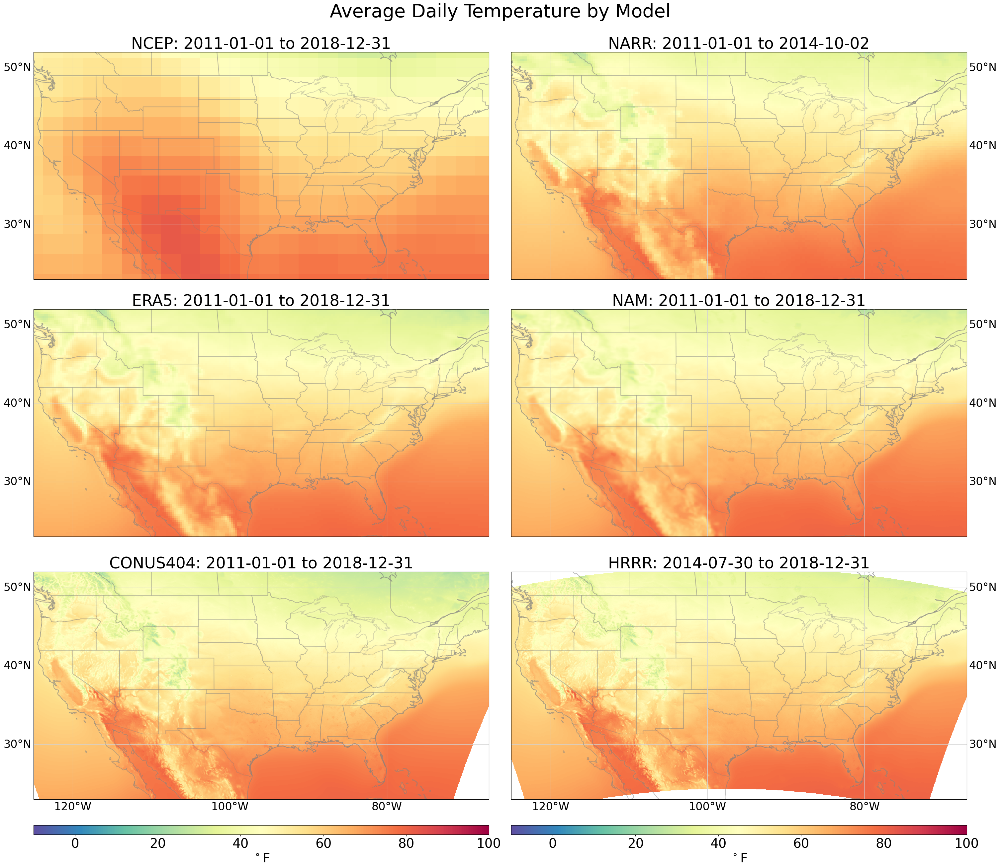

In [16]:
### do the plotting, calling the formatter function above to handle all the manual map formatting 

fig, axes = plt.subplots(nrows=nrows,ncols=ncols, subplot_kw={'projection': projection},figsize=fig_size, constrained_layout=True, facecolor = 'white')   

for i,ax in enumerate(axes.flatten()):

    m = models[i]
                
    ax = formatter(ax, extent, lccproj, i, ncols, nrows, y_gridlines, x_gridlines, gridline_font = 24, gridline_rotation = 0)
    
    ax.set_title(f'{models[i]}: {str(datasets[m].time.values[0])[0:10]} to {str(datasets[m].time.values[-1])[0:10]}', fontsize = 34)              # dynamically plot the title to inform the study average per model since they differ

    lats = datasets_avg[m].latitude
    lons = datasets_avg[m].longitude
    
    zf = ax.pcolormesh(lons, lats, ((datasets_avg[m][v]-273.15)*(9/5))+32, transform = lccproj, cmap = 'Spectral_r', vmin = -10, vmax = 100)


for c in range(ncols):
    cb = fig.colorbar(zf, ax=axes[nrows-1, c], aspect=50, pad = 0.05, location = 'bottom')
    cb.ax.tick_params(labelsize=28)
    cb.set_label(label='$^\circ$F', size = 28)


fig.suptitle(f'Average Daily Temperature by Model', fontsize=40, y = 1.04);     

#fig.savefig(f'TYPEYOURPATH', bbox_inches = "tight")  

# Example For: Seasonally Averaged Daily Temp Over the Study Period of Each

In [24]:
%%time
datasets_szn = {}

for m in models:
    print(m)
    datasets_szn[m] = datasets[m].groupby('time.season').mean('time').load()

NCEP
NARR
ERA5
NAM
CONUS404
HRRR
CPU times: user 4min 40s, sys: 49.1 s, total: 5min 29s
Wall time: 56.8 s


In [25]:
nrows = 6
ncols = 4
fig_size = (40,33)

extent = [-125, -67, 23, 52]
lccproj = ccrs.PlateCarree()                               
projection = ccrs.PlateCarree()

y_gridlines = np.arange(10, 80, 10)
x_gridlines = np.arange(-180,40, 20)

seasons = ['DJF', 'MAM', 'JJA', 'SON']

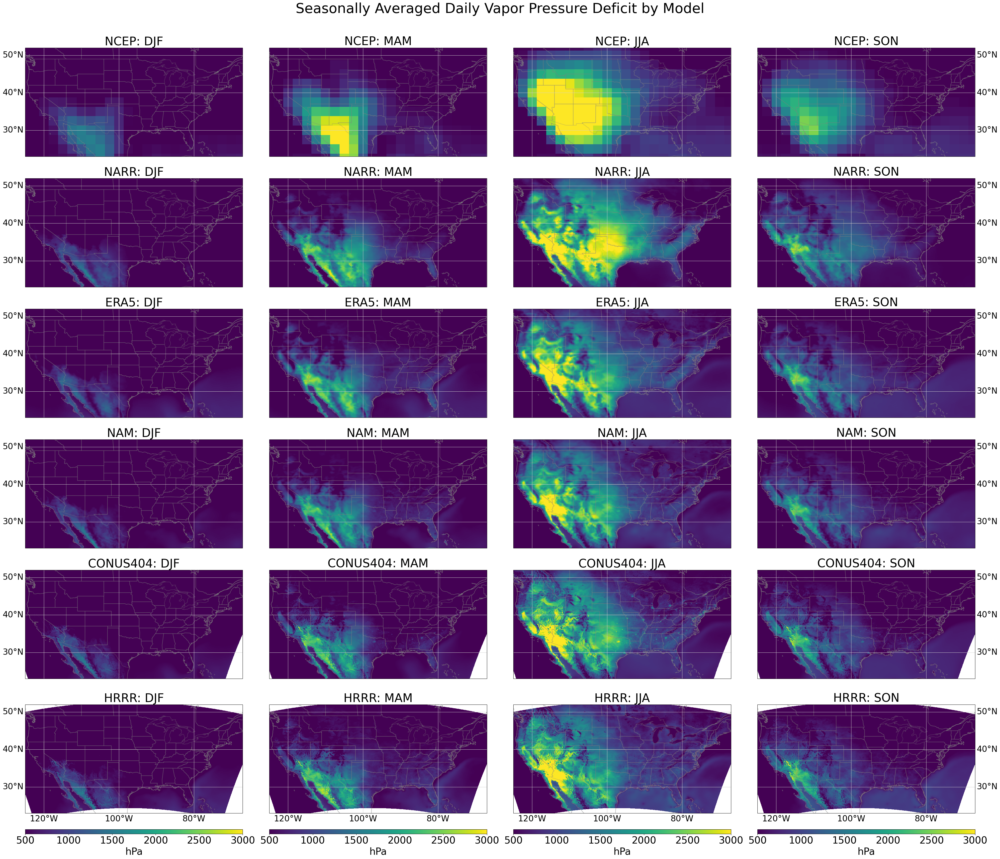

In [29]:
fig, axes = plt.subplots(nrows=nrows,ncols=ncols, subplot_kw={'projection': projection},figsize=fig_size, constrained_layout=True, facecolor = 'white')   

for i,ax in enumerate(axes.flatten()):

    model_selector = i // 4
    szn_selector = i % ncols

    m = models[model_selector]
                
    ax = formatter(ax, extent, lccproj, i, ncols, nrows, y_gridlines, x_gridlines, gridline_font = 24, gridline_rotation = 0)
    
    ax.set_title(f'{m}: {seasons[szn_selector]}', fontsize = 34)
    
    lats = datasets_szn[m].latitude
    lons = datasets_szn[m].longitude
    
    zf = ax.pcolormesh(lons, lats, ((datasets_szn[m][v].sel(season = seasons[szn_selector])-273.15)*(9/5))+32, transform = lccproj, cmap = 'Spectral_r', vmin = -10, vmax = 100)


for c in range(ncols):
    cb = fig.colorbar(zf, ax=axes[nrows-1, c], aspect=50, pad = 0.05, location = 'bottom')
    cb.ax.tick_params(labelsize=28)
    cb.set_label(label='$^\circ$F', size = 28)


fig.suptitle(f'Seasonally Averaged Daily Temperature by Model', fontsize=40, y = 1.04);     

#fig.savefig(f'TYPE/YOUR/PATH.png', bbox_inches = "tight")  

# Plot Average Daily Total Precip Over Alaska

In [5]:
input_dir = 'database_files_final'
t = 'Abs'
models = ['NCEP', 'NARR', 'ERA5']

In [6]:
model_var = {'ERA5': 'tp',
             'NARR': 'tp',
             'NCEP': 'prate'}

In [7]:
%%time
datasets = {}

for m, v in model_var.items():
    print(m)
    datasets[m] = xr.open_mfdataset(f'{input_dir}/{m}/{v}_{get_filename(m)}_{t}*.nc', chunks = get_chunk_sFWD(m))
    

ERA5
NARR
NCEP
CPU times: user 2.96 s, sys: 556 ms, total: 3.52 s
Wall time: 4.86 s


### Convert PRATE to TP; Convert 3-hr accumulated NARR to one hour; convert from seconds to hour

Since we have 4x daily each time step represents the instantaneous precipitation rate for that given timestep or 1-hr. All we do is multiply by 3600 (s)

In [8]:
datasets['NCEP']['tp'] = datasets['NCEP']['prate']*3600
datasets['NCEP'] = datasets['NCEP'].drop('prate')

In [9]:
datasets['NARR']['tp'] = datasets['NARR']['tp']*(1/3)
datasets['ERA5']['tp'] = datasets['ERA5']['tp']*3600

In [10]:
v = 'tp'

## Find the total of daily precipitation and then the average total over time 

In [11]:
%%time
datasets_avg = {}

for m in models:
    print(m)
    datasets_avg[m] = datasets[m].resample(time = '24H').sum().mean('time').load()

NCEP
NARR
ERA5
CPU times: user 2min 50s, sys: 29.8 s, total: 3min 19s
Wall time: 2min 46s


In [12]:
nrows = 1
ncols = 3
fig_size = (30,15)

extent = [-175, -135, 45, 75]

lccproj = ccrs.PlateCarree()                               
projection = ccrs.LambertConformal(central_longitude=200)         # Do not disservice the Last Frontier, respect her and give an appropriate projection. 

y_gridlines = np.arange(40, 80, 10)
x_gridlines = np.arange(-180,40, 10)

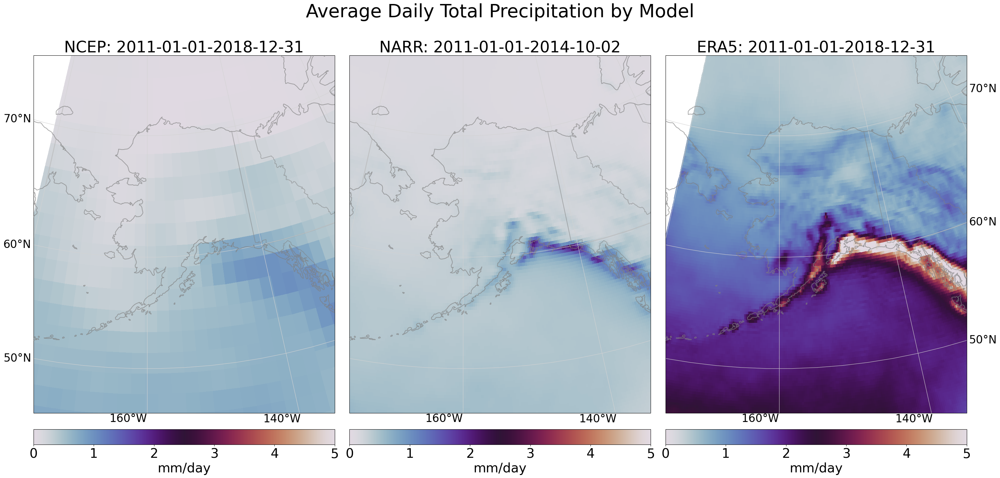

In [16]:
fig, axes = plt.subplots(nrows=nrows,ncols=ncols, subplot_kw={'projection': projection},figsize=fig_size, constrained_layout=True, facecolor = 'white')   

for i,ax in enumerate(axes.flatten()):

    m = models[i]
                
    ax = formatter(ax, extent, lccproj, i, ncols, nrows, y_gridlines, x_gridlines, gridline_font = 24, gridline_rotation = 0)
    
    ax.set_title(f'{models[i]}: {str(datasets[m].time.values[0])[0:10]}-{str(datasets[m].time.values[-1])[0:10]}', fontsize = 34)

    lats = datasets_avg[m].latitude
    lons = datasets_avg[m].longitude
    
    zf = ax.pcolormesh(lons, lats, datasets_avg[m][v], transform = lccproj, cmap = 'twilight', vmin = 0, vmax = 5)


for c in range(ncols):
    cb = fig.colorbar(zf, ax=axes[c], aspect=20, pad = 0.01, location = 'bottom')
    cb.ax.tick_params(labelsize=28)
    cb.set_label(label='mm/day', size = 28)


fig.suptitle(f'Average Daily Total Precipitation by Model', fontsize=40, y = 0.95);     

#fig.savefig(f'TYPEYOURPATH', bbox_inches = "tight")  

# Plot Max Wind Over Hawai'i

In [5]:
input_dir = 'database_files_final'
t = 'MAX_Daily'
models = ['NCEP', 'NARR', 'ERA5']

In [6]:
model_var = 'ws'             

In [7]:
%%time
datasets = {}

for m in models:
    print(m)
    datasets[m] = xr.open_mfdataset(f'{input_dir}/{m}/{model_var}_{get_filename(m)}_{t}*.nc', chunks = get_chunk_sFWD(m))
    

NCEP
NARR
ERA5
CPU times: user 2.76 s, sys: 384 ms, total: 3.14 s
Wall time: 3.16 s


## Average the Daily Max Over Time

In [8]:
%%time
datasets_avg = {}

for m in models:
    print(m)
    datasets_avg[m] = datasets[m].mean('time').load()

NCEP
NARR
ERA5
CPU times: user 22.3 s, sys: 6.04 s, total: 28.3 s
Wall time: 14.1 s


In [14]:
nrows = 1
ncols = 3
fig_size = (40,15)

extent = [-160, -154.5, 18, 23]

lccproj = ccrs.PlateCarree()                               
projection = ccrs.PlateCarree() 

y_gridlines = np.arange(18,24,1)
x_gridlines = np.arange(-180,180, 2)

Text(0.5, 0.98, 'Average Daily Max Wind Speed by Model')

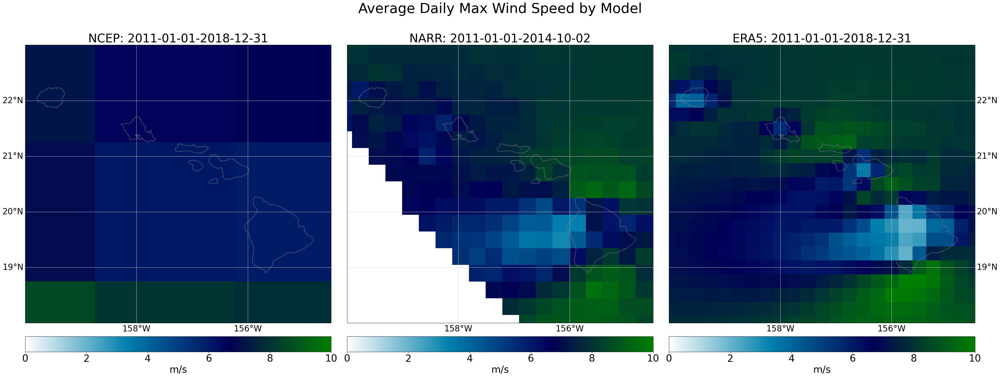

In [20]:
fig, axes = plt.subplots(nrows=nrows,ncols=ncols, subplot_kw={'projection': projection},figsize=fig_size, constrained_layout=True, facecolor = 'white')   

for i,ax in enumerate(axes.flatten()):

    m = models[i]
                
    ax = formatter(ax, extent, lccproj, i, ncols, nrows, y_gridlines, x_gridlines, gridline_font = 24, gridline_rotation = 0)
    
    ax.set_title(f'{models[i]}: {str(datasets[m].time.values[0])[0:10]}-{str(datasets[m].time.values[-1])[0:10]}', fontsize = 34)

    lats = datasets_avg[m].latitude
    lons = datasets_avg[m].longitude
    
    zf = ax.pcolormesh(lons, lats, datasets_avg[m][model_var], transform = lccproj, cmap = 'ocean_r', vmin = 0, vmax = 10)


for c in range(ncols):
    cb = fig.colorbar(zf, ax=axes[c], aspect=20, pad = 0.01, location = 'bottom')
    cb.ax.tick_params(labelsize=28)
    cb.set_label(label='m/s', size = 28)


fig.suptitle(f'Average Daily Max Wind Speed by Model', fontsize=40);     

#fig.savefig(f'TYPEYOURPATH', bbox_inches = "tight")  

## cool how the islands reflect a barrier effect from the trades 